In [2]:
!pip install ninja
!sudo apt-get update
!sudo apt-get install build-essential
!rm -rf ~/.cache/torch_extensions/

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 307.2/307.2 kB 19.4 MB/s eta 0:00:00
Get:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,626 B]
Get:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease [1,581 B]
Get:3 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  Packages [910 kB]
Get:4 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Hit:5 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:6 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Ign:7 https://r2u.stat.illinois.edu/ubuntu jammy InRelease
Get:8 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease [18.1 kB]
Get:9 https://r2u.stat.illinois.edu/ubuntu jammy Release [5,713 B]
Hit:10 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Get:11 https://r2u.stat.illinois.edu/ubuntu jammy Release.gpg [793 B]
Hit:12 http://archive.ubuntu.com/ubuntu jammy-backports InReleas

In [3]:
!pip install torch torchvision torchaudio --extra-index-url https://download.pytorch.org/whl/cu121


Looking in indexes: https://pypi.org/simple, https://download.pytorch.org/whl/cu121
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 61.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 54.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 105.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 731.7/731.7 MB 2.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 4.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.6/121.6 MB 7.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 MB 13.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.2/124.2 MB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.0/196.0 MB 7.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 176.2/176.2 MB 6.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.1/99.1 kB 9.4 MB/s eta 0:00:00
  Using cached nv

In [4]:
!pip install requests tqdm

In [5]:
!git clone https://github.com/NVlabs/stylegan2-ada-pytorch.git
%cd stylegan2-ada-pytorch


Cloning into 'stylegan2-ada-pytorch'...
remote: Enumerating objects: 131, done.
remote: Counting objects: 100% (3/3), done.
remote: Compressing objects: 100% (3/3), done.
remote: Total 131 (delta 0), reused 1 (delta 0), pack-reused 128
Receiving objects: 100% (131/131), 1.13 MiB | 22.70 MiB/s, done.
Resolving deltas: 100% (57/57), done.
/content/stylegan2-ada-pytorch


In [6]:
!wget https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada-pytorch/pretrained/ffhq.pkl

--2024-08-05 21:49:00--  https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada-pytorch/pretrained/ffhq.pkl
Resolving nvlabs-fi-cdn.nvidia.com (nvlabs-fi-cdn.nvidia.com)... 18.161.180.129, 18.161.180.67, 18.161.180.85, ...
Connecting to nvlabs-fi-cdn.nvidia.com (nvlabs-fi-cdn.nvidia.com)|18.161.180.129|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 381624121 (364M) [binary/octet-stream]
Saving to: ‘ffhq.pkl’

ffhq.pkl            100%[===================>] 363.94M   216MB/s    in 1.7s    

2024-08-05 21:49:02 (216 MB/s) - ‘ffhq.pkl’ saved [381624121/381624121]



In [7]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [8]:
# Import necessary libraries
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import os
import PIL.Image
import numpy as np
import dnnlib
import legacy

In [9]:
# Load pre-trained model
import pickle

with open('ffhq.pkl', 'rb') as f:
    data = pickle.load(f)

print(data.keys())

# Check if CUDA is available, and if so, move the model to GPU
if torch.cuda.is_available():
    G = data['G_ema'].cuda()
    D = data['D'].cuda()
    print("Model loaded on GPU.")
else:
    G = data['G_ema']  # Keep the model on CPU
    D = data['D'].cuda()
    print("CUDA not available, model loaded on CPU.")

print(type(G))
print(G)



dict_keys(['G', 'D', 'G_ema', 'training_set_kwargs', 'augment_pipe'])
Model loaded on GPU.
<class 'torch_utils.persistence.persistent_class.<locals>.Decorator'>
Generator(
  (synthesis): SynthesisNetwork(
    (b4): SynthesisBlock(
      (conv1): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (torgb): ToRGBLayer(
        (affine): FullyConnectedLayer()
      )
    )
    (b8): SynthesisBlock(
      (conv0): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (conv1): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (torgb): ToRGBLayer(
        (affine): FullyConnectedLayer()
      )
    )
    (b16): SynthesisBlock(
      (conv0): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (conv1): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (torgb): ToRGBLayer(
        (affine): FullyConnectedLayer()
      )
    )
    (b32): SynthesisBlock(
      (conv0): SynthesisLayer(
        (affine): Fu

In [10]:
print(type(D))
print(D)

<class 'torch_utils.persistence.persistent_class.<locals>.Decorator'>
Discriminator(
  (b1024): DiscriminatorBlock(
    (fromrgb): Conv2dLayer()
    (conv0): Conv2dLayer()
    (conv1): Conv2dLayer()
    (skip): Conv2dLayer()
  )
  (b512): DiscriminatorBlock(
    (conv0): Conv2dLayer()
    (conv1): Conv2dLayer()
    (skip): Conv2dLayer()
  )
  (b256): DiscriminatorBlock(
    (conv0): Conv2dLayer()
    (conv1): Conv2dLayer()
    (skip): Conv2dLayer()
  )
  (b128): DiscriminatorBlock(
    (conv0): Conv2dLayer()
    (conv1): Conv2dLayer()
    (skip): Conv2dLayer()
  )
  (b64): DiscriminatorBlock(
    (conv0): Conv2dLayer()
    (conv1): Conv2dLayer()
    (skip): Conv2dLayer()
  )
  (b32): DiscriminatorBlock(
    (conv0): Conv2dLayer()
    (conv1): Conv2dLayer()
    (skip): Conv2dLayer()
  )
  (b16): DiscriminatorBlock(
    (conv0): Conv2dLayer()
    (conv1): Conv2dLayer()
    (skip): Conv2dLayer()
  )
  (b8): DiscriminatorBlock(
    (conv0): Conv2dLayer()
    (conv1): Conv2dLayer()
    (ski

In [11]:
def generate_images(G, z=None, num_images=1, truncation_psi=0.7, seed=None):
    if seed is not None:
        torch.manual_seed(seed)

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    if torch.cuda.is_available():
        print("CUDA is available. Using GPU.")
    else:
        print("CUDA is not available. Using CPU.")

    if z is None:
        z = torch.randn((num_images, G.z_dim), device=device)
    else:
        z = z.to(device)

    print("Latent vectors prepared.")

    ws = G.mapping(z, None, truncation_psi=truncation_psi)
    print("Mapping done.")

    img = G.synthesis(ws, noise_mode='const')
    print("Synthesis done.")

    img = (img.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8).cpu().numpy()
    print("Image tensor converted to numpy array.")

    return [Image.fromarray(i) for i in img]

In [12]:
from PIL import Image  # Add this import


In [13]:
# Generate 4 images
generated_images = generate_images(G, num_images=4, truncation_psi=0.7, seed=42)

CUDA is available. Using GPU.
Latent vectors prepared.
Setting up PyTorch plugin "bias_act_plugin"... 

/usr/local/lib/python3.10/dist-packages/torch/utils/cpp_extension.py:1967: UserWarning: TORCH_CUDA_ARCH_LIST is not set, all archs for visible cards are included for compilation. 
If this is not desired, please set os.environ['TORCH_CUDA_ARCH_LIST'].
  warnings.warn(


Done.
Mapping done.
Setting up PyTorch plugin "upfirdn2d_plugin"... 

/usr/local/lib/python3.10/dist-packages/torch/utils/cpp_extension.py:1967: UserWarning: TORCH_CUDA_ARCH_LIST is not set, all archs for visible cards are included for compilation. 
If this is not desired, please set os.environ['TORCH_CUDA_ARCH_LIST'].
  warnings.warn(


Done.
Synthesis done.
Image tensor converted to numpy array.


Images generated.


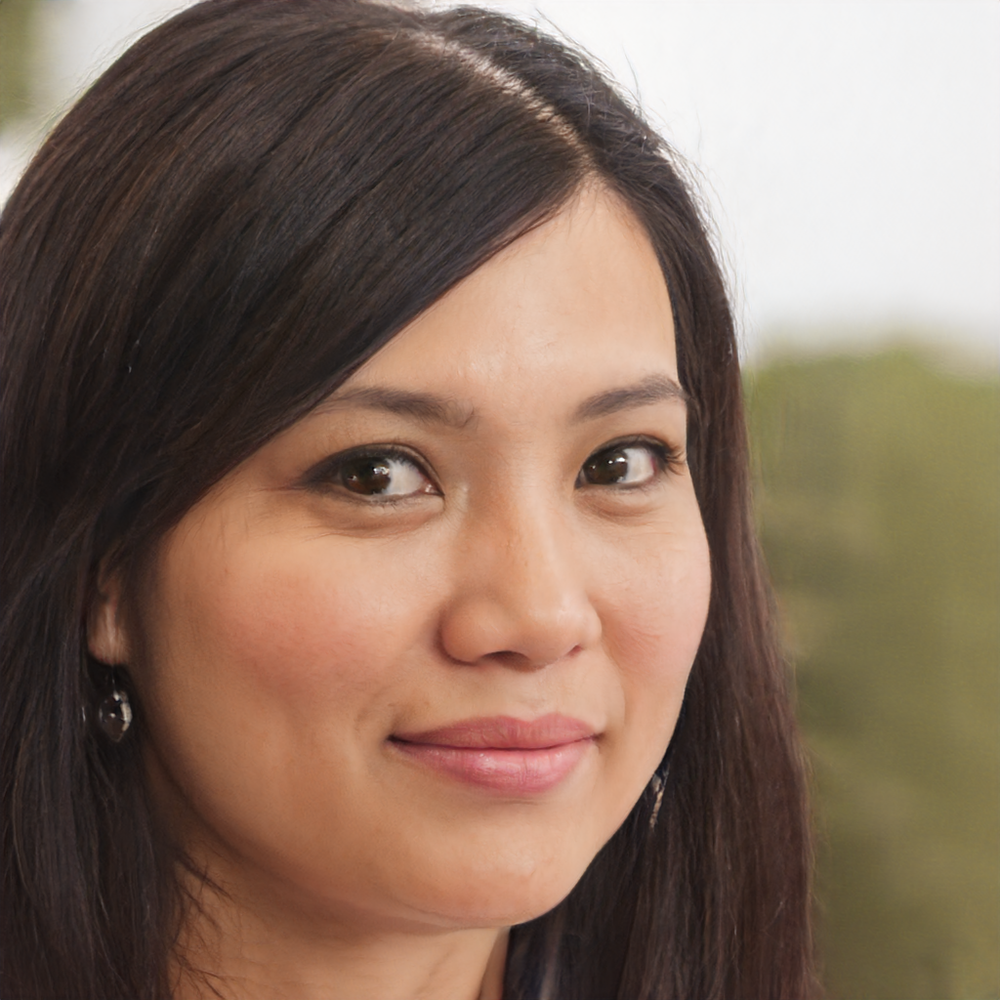

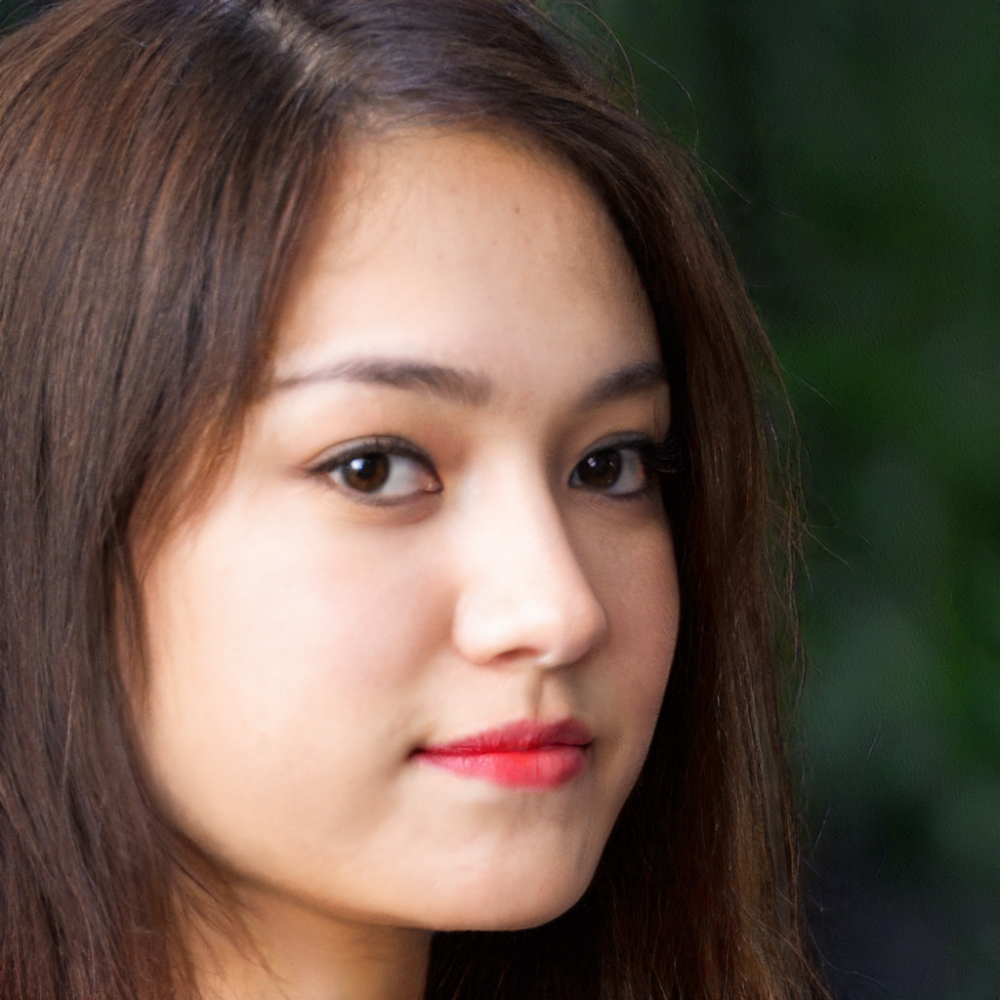

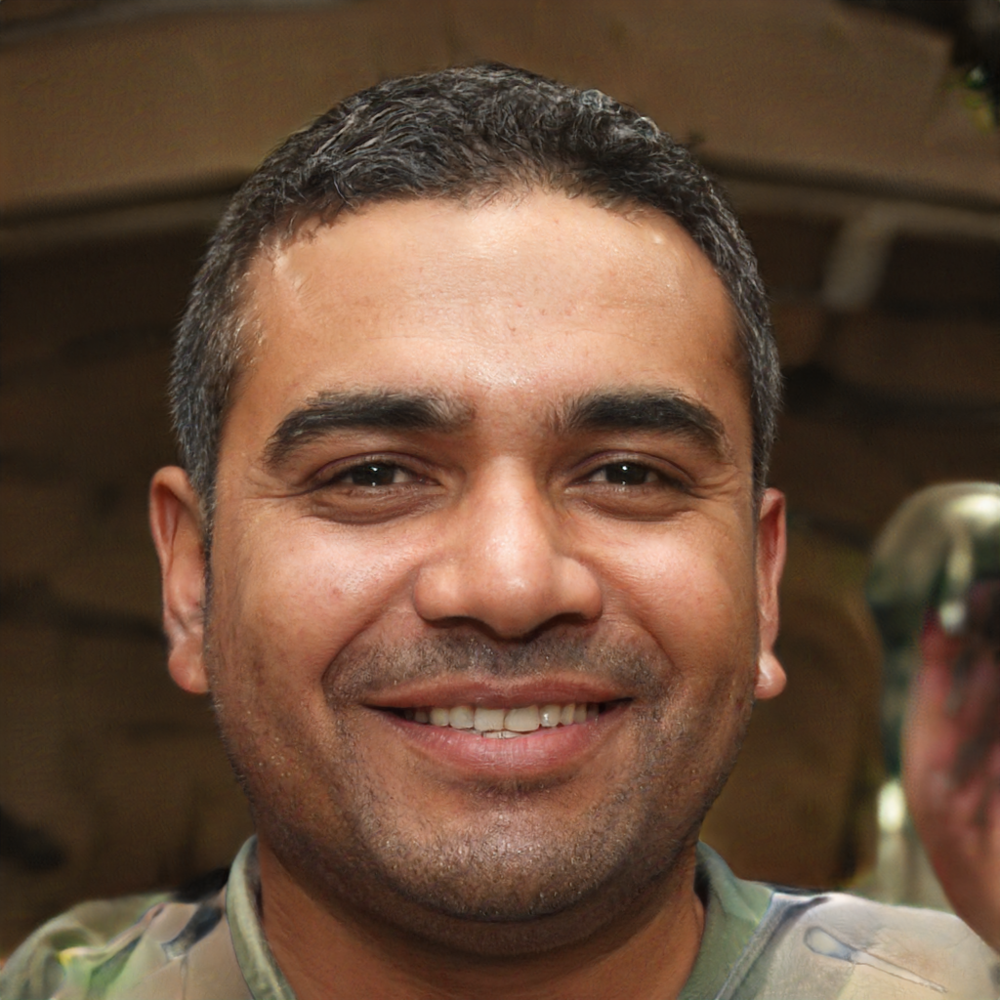

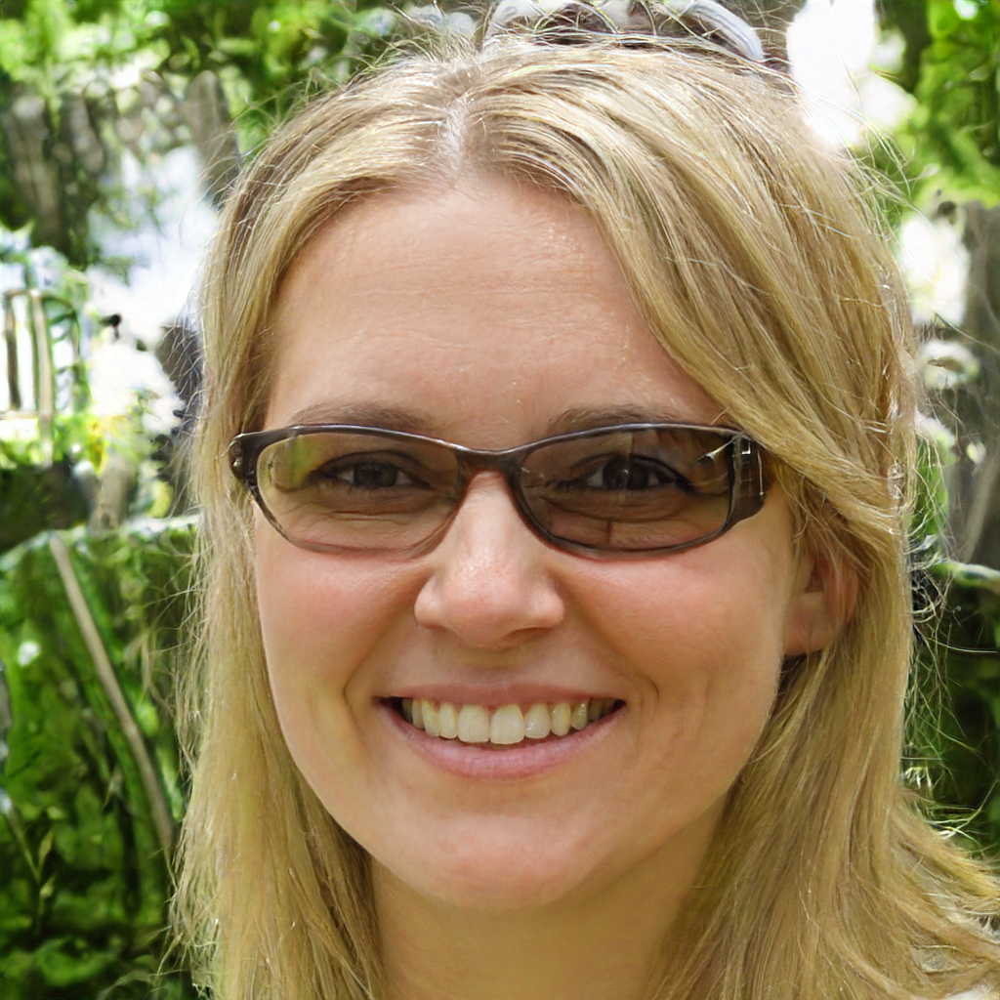

In [14]:
# Generate and display 4 images
#generated_images = generate_images(G, num_images=4, truncation_psi=0.7, seed=42)
print("Images generated.")
for i, img in enumerate(generated_images):
    display(img)

In [15]:
# Fine-tuning setup
import os
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms


In [16]:
# Advanced fine-tuning setup
import torch
from torch.optim import Adam
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torchvision.utils import save_image

# Custom dataset
class CustomDataset(Dataset):
    def __init__(self, image_dir, transform=None):
        self.image_dir = image_dir
        self.image_files = [f for f in os.listdir(image_dir) if f.endswith('.jpg') or f.endswith('.png')]

        if len(self.image_files) == 0:
            raise ValueError(f"No image files found in directory: {image_dir}")

        self.transform = transform

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_path = os.path.join(self.image_dir, self.image_files[idx])
        image = PIL.Image.open(img_path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image


In [17]:
# Set up data loading
transform = transforms.Compose([
    transforms.Resize((G.img_resolution, G.img_resolution)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

dataset = CustomDataset("/content/drive/MyDrive/Colab Notebooks/part2", transform=transform)
dataloader = DataLoader(dataset, batch_size=4, shuffle=True)

In [18]:
# Fine-tuning loop (advanced)
optimizer_g = Adam(G.parameters(), lr=0.0001, betas=(0, 0.99), eps=1e-8)
optimizer_d = Adam(D.parameters(), lr=0.0001, betas=(0, 0.99), eps=1e-8)
scheduler_g = torch.optim.lr_scheduler.ExponentialLR(optimizer_g, gamma=0.99)
scheduler_d = torch.optim.lr_scheduler.ExponentialLR(optimizer_d, gamma=0.99)

num_epochs = 50
for epoch in range(num_epochs):
    for batch in dataloader:
        real_images = batch.cuda()

        # Generate fake images
        z = torch.randn([batch.shape[0], G.z_dim]).cuda()
        fake_images = G(z, None)  # Replace None with actual labels if available

        # Ensure fake_images requires gradients
        fake_images.requires_grad_(True)

        # Prepare a dummy label (replace with actual labels if available)
        c = None  # Replace 'some_dimension' with the correct size

        # Compute loss (using BCE loss)
        g_loss = torch.mean(torch.log(1 - D(fake_images, c)))  # Pass the dummy label to D
        d_loss_real = torch.mean(torch.log(D(real_images, c))) # Pass the dummy label to D
        d_loss_fake = torch.mean(torch.log(1 - D(fake_images, c))) # Pass the dummy label to D
        d_loss = -d_loss_real - d_loss_fake

        # Check for NaNs
        if torch.isnan(g_loss) or torch.isnan(d_loss):
            #print("NaN detected in loss. Skipping update.")
            continue

        # Update generator
        optimizer_g.zero_grad()
        g_loss.backward()
        torch.nn.utils.clip_grad_norm_(G.parameters(), max_norm=1)  # Clip gradients
        optimizer_g.step()

        # Update discriminator
        optimizer_d.zero_grad()
        d_loss.backward()
        torch.nn.utils.clip_grad_norm_(D.parameters(), max_norm=1)  # Clip gradients
        optimizer_d.step()

    # Update learning rate
    scheduler_g.step()
    scheduler_d.step()

    print(f"Epoch {epoch+1}/{num_epochs}, G Loss: {g_loss.item()}")

/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:143: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn("Detected call of `lr_scheduler.step()` before `optimizer.step()`. "


Epoch 1/50, G Loss: 1.1808594465255737
Epoch 2/50, G Loss: 1.454993486404419
Epoch 3/50, G Loss: 1.2277297973632812
Epoch 4/50, G Loss: 0.7369842529296875
Epoch 5/50, G Loss: 1.1191973686218262
Epoch 6/50, G Loss: 1.0954012870788574
Epoch 7/50, G Loss: 1.785097599029541
Epoch 8/50, G Loss: 1.045012354850769
Epoch 9/50, G Loss: 1.636612892150879
Epoch 10/50, G Loss: 1.0185635089874268
Epoch 11/50, G Loss: 0.8252370953559875
Epoch 12/50, G Loss: 1.0624065399169922
Epoch 13/50, G Loss: 1.7159591913223267
Epoch 14/50, G Loss: 0.9898425936698914
Epoch 15/50, G Loss: 1.3792617321014404
Epoch 16/50, G Loss: 1.6049325466156006
Epoch 17/50, G Loss: 1.002794623374939
Epoch 18/50, G Loss: 1.2368683815002441
Epoch 19/50, G Loss: 1.2000799179077148
Epoch 20/50, G Loss: 1.4179607629776
Epoch 21/50, G Loss: 1.2480136156082153
Epoch 22/50, G Loss: 1.1287113428115845
Epoch 23/50, G Loss: 0.42003190517425537
Epoch 24/50, G Loss: 1.6294968128204346
Epoch 25/50, G Loss: 0.8875346779823303
Epoch 26/50, G L

In [19]:
# Save the full model
torch.save(G, '/content/drive/MyDrive/full_model_stylegan.pt')

In [ ]:
for param in G.parameters():
    param.requires_grad = True

CUDA is available. Using GPU.
Latent vectors prepared.
Mapping done.
Synthesis done.
Image tensor converted to numpy array.


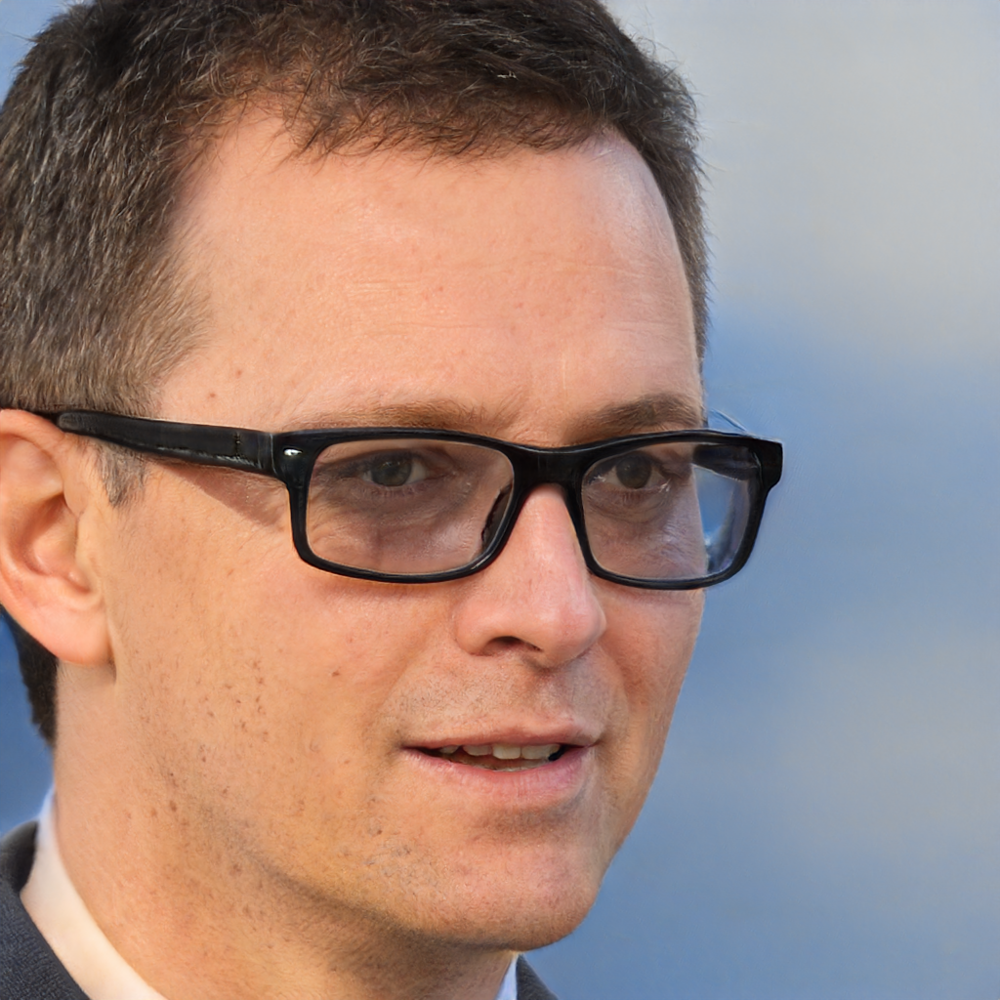

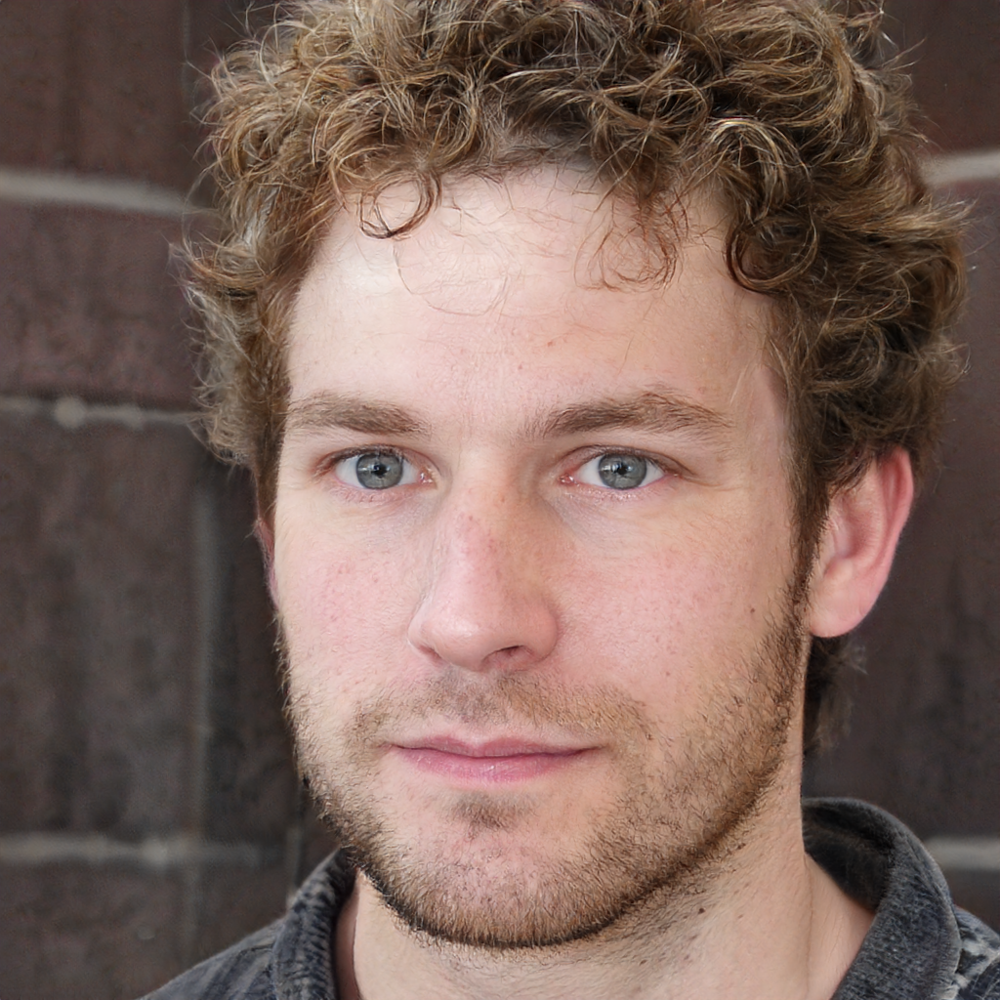

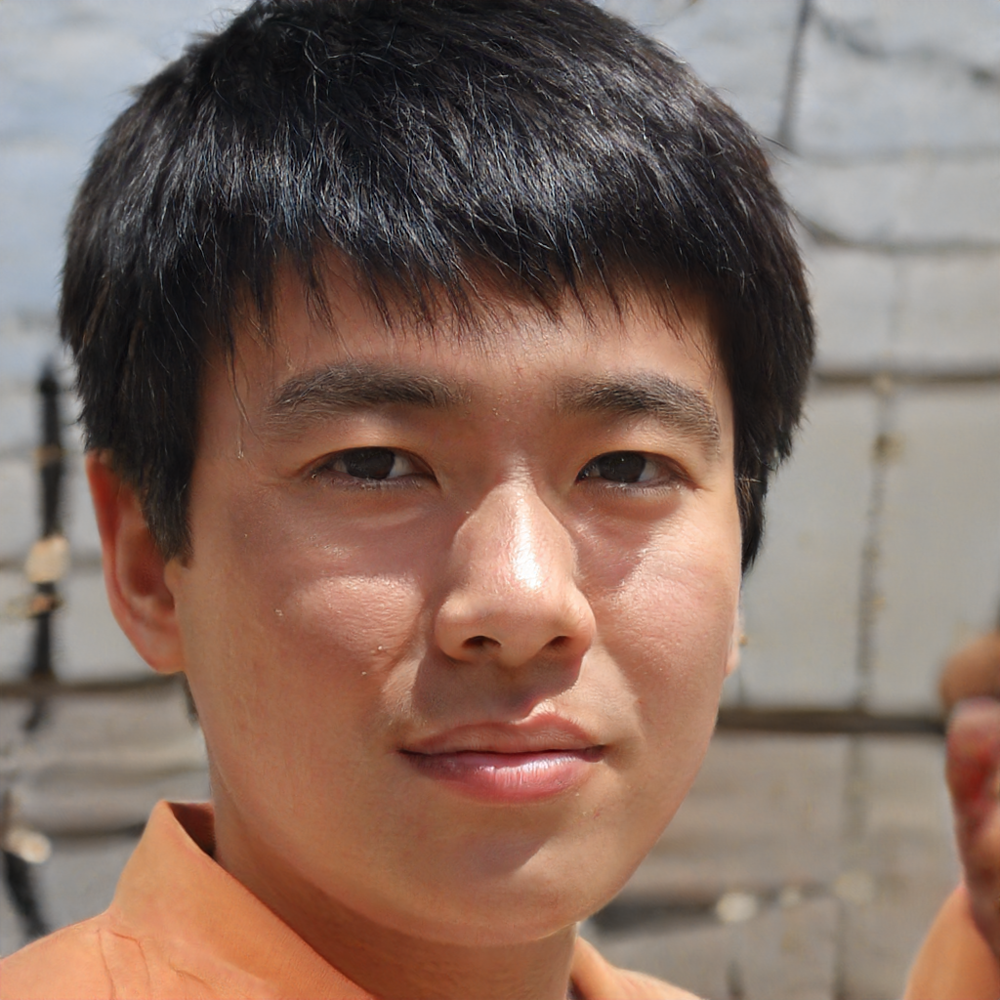

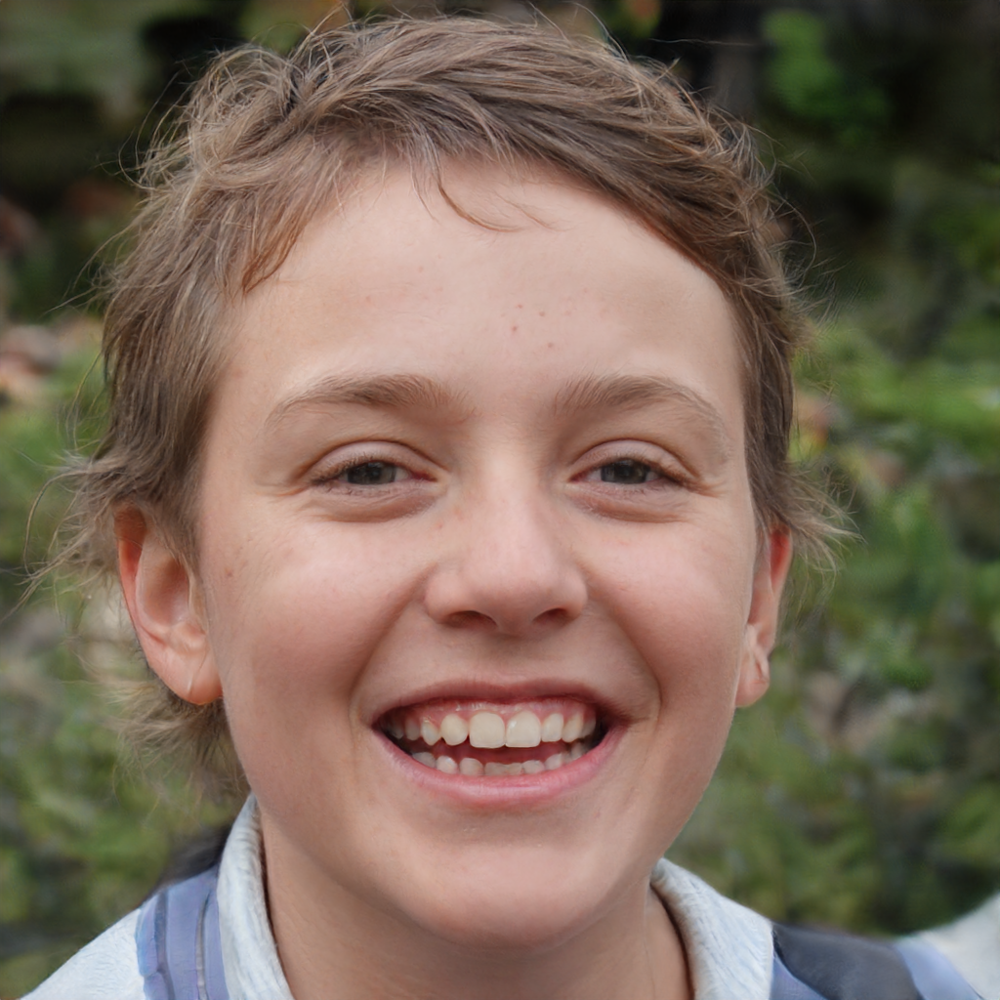

In [21]:
# Generate new images with fine-tuned model
z = torch.randn([4, G.z_dim]).cuda()  # Generate 4 random latent vectors
imgs = generate_images(G, z, truncation_psi=0.7)

# Display each generated image
for img in imgs:
    display(img)

In [22]:
# Save the fine-tuned model
torch.save(G.state_dict(), '/content/drive/MyDrive/Colab Notebooks/fine_tuned_stylegan.pth')

In [ ]:
!pip install gradio

In [ ]:
import torch
import torchvision.transforms as transforms
from PIL import Image
import gradio as gr
from tqdm import tqdm

In [ ]:
def optimize_latent_vector(G, target_image, num_iterations=1000):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    target_image = transforms.Resize((G.img_resolution, G.img_resolution))(target_image)
    target_tensor = transforms.ToTensor()(target_image).unsqueeze(0).to(device)
    target_tensor = (target_tensor * 2) - 1  # Normalize to [-1, 1]

    latent_vector = torch.randn((1, G.z_dim), device=device, requires_grad=True)
    optimizer = torch.optim.Adam([latent_vector], lr=0.1)

    for i in tqdm(range(num_iterations), desc="Optimizing latent vector"):
        optimizer.zero_grad()

        generated_image = G(latent_vector, None)
        loss = torch.nn.functional.mse_loss(generated_image, target_tensor)

        loss.backward()
        optimizer.step()

        if (i + 1) % 100 == 0:
            print(f'Iteration {i+1}/{num_iterations}, Loss: {loss.item()}')

    return latent_vector.detach()

def generate_from_upload(uploaded_image):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    # Optimize latent vector for the uploaded image
    optimized_z = optimize_latent_vector(G, uploaded_image)

    # Generate variations
    num_variations = 4
    variation_strength = 0.1
    varied_z = optimized_z + torch.randn((num_variations, G.z_dim), device=device) * variation_strength

    # Generate the variations
    with torch.no_grad():
        imgs = G(varied_z, c=None, truncation_psi=0.7, noise_mode='const')

    imgs = (imgs * 127.5 + 128).clamp(0, 255).to(torch.uint8)
    imgs = imgs.permute(0, 2, 3, 1).cpu().numpy()

    # Convert the generated image tensors to PIL Images
    generated_images = [Image.fromarray(img) for img in imgs]

    # Return the images separately
    return generated_images[0], generated_images[1], generated_images[2], generated_images[3]

# Create the Gradio interface
iface = gr.Interface(
    fn=generate_from_upload,
    inputs=gr.Image(type="pil"),
    outputs=[gr.Image(type="pil") for _ in range(4)],
    title="StyleGAN Image Variation Generator"
)

# Launch the Gradio interface
iface.launch(share=True, debug=True)

Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
Running on public URL: https://26f8fef8d899dfdddb.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from Terminal to deploy to Spaces (https://huggingface.co/spaces)


Optimizing latent vector:  10%|█         | 102/1000 [00:11<01:40,  8.92it/s]

Iteration 100/1000, Loss: 0.308247447013855


Optimizing latent vector:  20%|██        | 201/1000 [00:23<01:35,  8.39it/s]

Iteration 200/1000, Loss: 0.11948028206825256


Optimizing latent vector:  30%|███       | 302/1000 [00:34<01:16,  9.12it/s]

Iteration 300/1000, Loss: 0.09571419656276703


Optimizing latent vector:  40%|████      | 402/1000 [00:45<01:04,  9.27it/s]

Iteration 400/1000, Loss: 0.09594671428203583


Optimizing latent vector:  50%|█████     | 502/1000 [00:56<00:54,  9.10it/s]

Iteration 500/1000, Loss: 0.09107643365859985


Optimizing latent vector:  60%|██████    | 602/1000 [01:07<00:43,  9.18it/s]

Iteration 600/1000, Loss: 0.09299707412719727


Optimizing latent vector:  70%|███████   | 702/1000 [01:18<00:32,  9.20it/s]

Iteration 700/1000, Loss: 0.09335952997207642


Optimizing latent vector:  80%|████████  | 802/1000 [01:29<00:21,  9.29it/s]

Iteration 800/1000, Loss: 0.08709218353033066


Optimizing latent vector:  90%|█████████ | 902/1000 [01:40<00:10,  9.07it/s]

Iteration 900/1000, Loss: 0.08917944878339767


Optimizing latent vector: 100%|██████████| 1000/1000 [01:50<00:00,  9.02it/s]


Iteration 1000/1000, Loss: 0.08399512618780136


Optimizing latent vector:  10%|█         | 102/1000 [00:11<01:37,  9.17it/s]

Iteration 100/1000, Loss: 0.11524810642004013


Optimizing latent vector:  20%|██        | 202/1000 [00:22<01:28,  9.06it/s]

Iteration 200/1000, Loss: 0.10832705348730087


Optimizing latent vector:  30%|███       | 302/1000 [00:33<01:16,  9.10it/s]

Iteration 300/1000, Loss: 0.10232146829366684


Optimizing latent vector:  40%|████      | 402/1000 [00:44<01:05,  9.12it/s]

Iteration 400/1000, Loss: 0.10173660516738892


Optimizing latent vector:  50%|█████     | 502/1000 [00:55<00:54,  9.15it/s]

Iteration 500/1000, Loss: 0.09593098610639572


Optimizing latent vector:  60%|██████    | 602/1000 [01:06<00:42,  9.35it/s]

Iteration 600/1000, Loss: 0.09519848227500916


Optimizing latent vector:  70%|███████   | 702/1000 [01:17<00:31,  9.33it/s]

Iteration 700/1000, Loss: 0.09774025529623032


Optimizing latent vector:  80%|████████  | 802/1000 [01:28<00:21,  9.12it/s]

Iteration 800/1000, Loss: 0.09438487887382507


Optimizing latent vector:  90%|█████████ | 901/1000 [01:38<00:11,  8.61it/s]

Iteration 900/1000, Loss: 0.09320774674415588


Optimizing latent vector: 100%|██████████| 1000/1000 [01:49<00:00,  9.11it/s]


Iteration 1000/1000, Loss: 0.0922076404094696


Optimizing latent vector:  10%|█         | 102/1000 [00:11<01:37,  9.17it/s]

Iteration 100/1000, Loss: 0.11340131610631943


Optimizing latent vector:  20%|██        | 202/1000 [00:22<01:29,  8.93it/s]

Iteration 200/1000, Loss: 0.0937836691737175


Optimizing latent vector:  30%|███       | 302/1000 [00:33<01:16,  9.15it/s]

Iteration 300/1000, Loss: 0.08831225335597992


Optimizing latent vector:  40%|████      | 402/1000 [00:44<01:04,  9.21it/s]

Iteration 400/1000, Loss: 0.07421188056468964


Optimizing latent vector:  50%|█████     | 502/1000 [00:55<00:54,  9.16it/s]

Iteration 500/1000, Loss: 0.06166312098503113


Optimizing latent vector:  60%|██████    | 602/1000 [01:06<00:42,  9.36it/s]

Iteration 600/1000, Loss: 0.0597362220287323


Optimizing latent vector:  70%|███████   | 702/1000 [01:17<00:32,  9.31it/s]

Iteration 700/1000, Loss: 0.056090742349624634


Optimizing latent vector:  80%|████████  | 802/1000 [01:27<00:21,  9.23it/s]

Iteration 800/1000, Loss: 0.0521339550614357


Optimizing latent vector:  90%|█████████ | 902/1000 [01:38<00:10,  9.25it/s]

Iteration 900/1000, Loss: 0.04996567219495773


Optimizing latent vector: 100%|██████████| 1000/1000 [01:49<00:00,  9.12it/s]


Iteration 1000/1000, Loss: 0.04799548536539078


In [ ]:
gradio_app_code = """
import torch
import torchvision.transforms as transforms
from PIL import Image
import gradio as gr
from tqdm import tqdm

def optimize_latent_vector(G, target_image, num_iterations=1000):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    target_image = transforms.Resize((G.img_resolution, G.img_resolution))(target_image)
    target_tensor = transforms.ToTensor()(target_image).unsqueeze(0).to(device)
    target_tensor = (target_tensor * 2) - 1  # Normalize to [-1, 1]

    latent_vector = torch.randn((1, G.z_dim), device=device, requires_grad=True)
    optimizer = torch.optim.Adam([latent_vector], lr=0.1)

    for i in tqdm(range(num_iterations), desc="Optimizing latent vector"):
        optimizer.zero_grad()

        generated_image = G(latent_vector, None)
        loss = torch.nn.functional.mse_loss(generated_image, target_tensor)

        loss.backward()
        optimizer.step()

        if (i + 1) % 100 == 0:
            print(f'Iteration {i+1}/{num_iterations}, Loss: {loss.item()}')

    return latent_vector.detach()

def generate_from_upload(uploaded_image):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    # Optimize latent vector for the uploaded image
    optimized_z = optimize_latent_vector(G, uploaded_image)

    # Generate variations
    num_variations = 4
    variation_strength = 0.1
    varied_z = optimized_z + torch.randn((num_variations, G.z_dim), device=device) * variation_strength

    # Generate the variations
    with torch.no_grad():
        imgs = G(varied_z, c=None, truncation_psi=0.7, noise_mode='const')

    imgs = (imgs * 127.5 + 128).clamp(0, 255).to(torch.uint8)
    imgs = imgs.permute(0, 2, 3, 1).cpu().numpy()

    # Convert the generated image tensors to PIL Images
    generated_images = [Image.fromarray(img) for img in imgs]

    # Return the images separately
    return generated_images[0], generated_images[1], generated_images[2], generated_images[3]

# Create the Gradio interface
iface = gr.Interface(
    fn=generate_from_upload,
    inputs=gr.Image(type="pil"),
    outputs=[gr.Image(type="pil") for _ in range(4)],
    title="StyleGAN Image Variation Generator"
)

# Launch the Gradio interface
iface.launch(share=True, debug=True)
"""

with open("app.py", "w") as file:
    file.write(gradio_app_code)


In [ ]:
!gradio deploy